<a href="https://colab.research.google.com/github/hitokun-s/kagomma/blob/master/pyannote_video%20-%20Face%20Detection%2C%20Tracking%20%26%20clustering%20in%20Videos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

pyannote-video
---
**A toolkit for face detection, tracking, and clustering in videos**

In [1]:
!apt update
!apt upgrade -y
!uname -m && cat /etc/*release
!gcc --version
!uname -r

Hit:1 https://cli.github.com/packages stable InRelease
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [2,008 kB]
Get:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:11 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:13 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Pa

In [2]:
!nvidia-smi

Sun Sep 21 13:06:30 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

To access Google Drive Folder and Files

In [3]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# After executing the cell above, Drive
# files will be present in "/content/drive/My Drive".
!ls "/content/drive/My Drive/GoogleColab"

ls: cannot access '/content/drive/My Drive/GoogleColab': No such file or directory


Create Directory & Copy File From Google Drive

In [5]:
%mkdir pyannote-data
!cp -r "/content/drive/My Drive/GoogleColab/BRICS.mp4" pyannote-data/

cp: cannot stat '/content/drive/My Drive/GoogleColab/BRICS.mp4': No such file or directory


**Upgrading all packages with pip**

In [6]:
!pip list --format=freeze | grep -v '^\-e' | cut -d = -f 1  | xargs -n1 pip install -U

ERROR: List format 'freeze' cannot be used with the --outdated option.
ERROR: You must give at least one requirement to install (see "pip help install")


Then, install pyannote-video and its dependencies:

In [ ]:
!pip install imageio==2.4.1 imgaug==0.2.5 mido==1.2.6 python-rtmidi==1.2
!pip install pyannote-video

Finally, download sample video and dlib models:

In [ ]:
!git clone https://github.com/pyannote/pyannote-data.git
!git clone https://github.com/davisking/dlib-models.git
!bunzip2 dlib-models/dlib_face_recognition_resnet_model_v1.dat.bz2
!bunzip2 dlib-models/shape_predictor_68_face_landmarks.dat.bz2

In [ ]:
ls pyannote-data/

BRICS.mp4


In [ ]:
!git clone https://github.com/pyannote/pyannote-video.git

Cloning into 'pyannote-video'...
remote: Enumerating objects: 13, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 964 (delta 2), reused 7 (delta 2), pack-reused 951
Receiving objects: 100% (964/964), 18.41 MiB | 32.90 MiB/s, done.
Resolving deltas: 100% (524/524), done.


In [ ]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


Shot segmentation
---

In [ ]:
!pyannote-structure.py --help

In [ ]:
!pyannote-structure.py shot --verbose pyannote-data/BRICS.mp4 \
                                      pyannote-data/BRICS.shots.json

1.07kframes [00:52, 20.2frames/s]           


Detected shot boundaries can be visualized using pyannote.core notebook support:

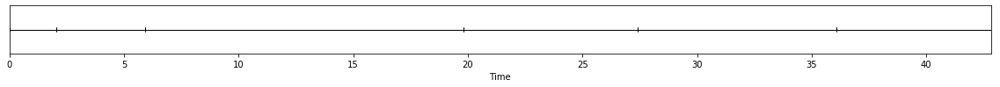

In [ ]:
from pyannote.core.json import load_from
shots = load_from('pyannote-data/BRICS.shots.json')
shots

Face processing
---

In [ ]:
!pyannote-face.py --help

In [ ]:
!pyannote-face.py track --verbose --every=0.5 pyannote-data/BRICS.mp4 \
                                              pyannote-data/BRICS.shots.json \
                                              pyannote-data/BRICS.track.txt

1.07kframes [02:22, 7.53frames/s]           


**Face tracking**

Face tracks can be visualized using demo mode:

In [ ]:
!pyannote-face.py demo pyannote-data/BRICS.mp4 \
                       pyannote-data/BRICS.track.txt \
                       pyannote-data/BRICS.track.mp4

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)1835008/45929032 bytes (4.0%)5709824/45929032 bytes (12.4%)9453568/45929032 bytes (20.6%)13320192/45929032 bytes (29.0%)17096704/45929032 bytes (37.2%)21004288/45929032 bytes (45.7%)24764416/45929032 bytes (53.9%)28647424/45929032 bytes (62.4%)32210944/45929032 bytes (70.1%)36093952/45929032 bytes (78.6%)39837696/45929032 bytes (86.7%)43712512/45929032 bytes (95.2%)

In [ ]:
import io
import base64
from IPython.display import HTML
video = io.open('pyannote-data/BRICS.track.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls><source src="data:video/mp4;base64,{0}" type="video/mp4" /></video>'''.format(encoded.decode('ascii')))

Facial landmarks and face embedding
---

In [ ]:
!pyannote-face.py extract --verbose pyannote-data/BRICS.mp4 \
                                    pyannote-data/BRICS.track.txt \
                                    dlib-models/shape_predictor_68_face_landmarks.dat \
                                    dlib-models/dlib_face_recognition_resnet_model_v1.dat \
                                    pyannote-data/BRICS.landmarks.txt \
                                    pyannote-data/BRICS.embedding.txt

1.07kframes [00:40, 26.5frames/s]           


Face clustering
---
Once embeddings are extracted, let's apply face track hierarchical agglomerative clustering.
The distance between two clusters is defined as the average euclidean distance between all embeddings.

In [ ]:
from pyannote.video.face.clustering import FaceClustering
clustering = FaceClustering(threshold=0.6)

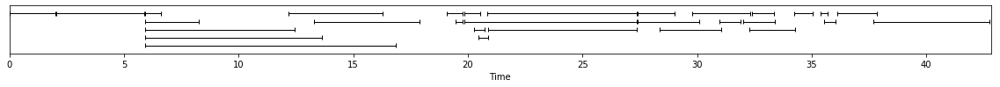

In [ ]:
face_tracks, embeddings = clustering.model.preprocess('pyannote-data/BRICS.embedding.txt')
face_tracks.get_timeline()

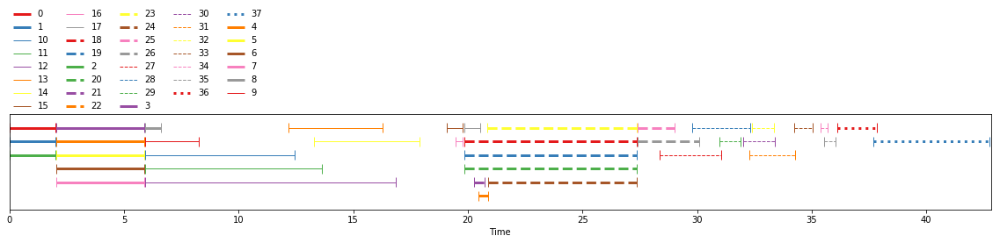

In [ ]:
face_tracks

In [ ]:
result = clustering(face_tracks, features=embeddings)


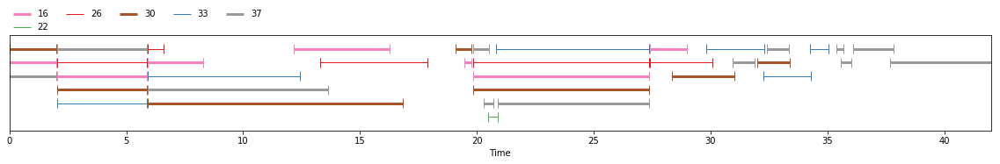

In [ ]:
result

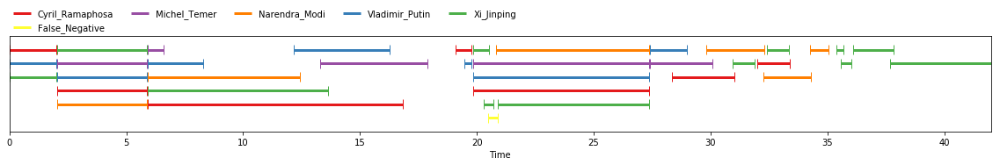

In [ ]:
from pyannote.core import notebook, Segment
notebook.reset()
notebook.crop = Segment(0, 42)
#mapping = {8: 'Vladimir Putin', 22: 'Michel Temer', 23:'Cyril Ramaphosa', 40:'Xi Jinping', 39:'Narendra Modi', 6:'False Negative'}
mapping = {16: 'Vladimir_Putin', 26: 'Michel_Temer', 30:'Cyril_Ramaphosa', 37:'Xi_Jinping', 33:'Narendra_Modi', 22:'False_Negative'}
result = result.rename_labels(mapping=mapping)
result

In [ ]:
with open('pyannote-data/BRICS1.labels.txt', 'w') as fp:
    for _, track_id, cluster in result.itertracks(yield_label=True):
        fp.write(f'{track_id} {cluster}\n')

In [ ]:
!pyannote-face.py demo pyannote-data/BRICS.mp4 \
                       pyannote-data/BRICS.track.txt \
                       --label=pyannote-data/BRICS1.labels.txt \
                       pyannote-data/BRICS1.final.mp4

[MoviePy] >>>> Building video pyannote-data/BRICS1.final.mp4
[MoviePy] Writing audio in BRICS1.finalTEMP_MPY_wvf_snd.mp3
100% 945/945 [00:00<00:00, 1066.31it/s]
[MoviePy] Done.
[MoviePy] Writing video pyannote-data/BRICS1.final.mp4
100% 1071/1071 [00:39<00:00, 27.31it/s]
[MoviePy] Done.
[MoviePy] >>>> Video ready: pyannote-data/BRICS1.final.mp4 



In [ ]:
import io
import base64
from IPython.display import HTML
video = io.open('pyannote-data/BRICS1.final.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls><source src="data:video/mp4;base64,{0}" type="video/mp4" /></video>'''.format(encoded.decode('ascii')))

In [ ]:
from google.colab import files
files.download('pyannote-data/BRICS1.final.mp4')

In [ ]:
ls pyannote-data/

BRICS1.final.mp4     BRICS.landmarks.txt  CHANGELOG.md
BRICS1.labels.txt    BRICS.mp4            dlib.face.landmarks.dat
BRICS.embedding.txt  BRICS.shots.json     openface.nn4.small2.v1.t7
BRICS.final.mp4      BRICS.track.mp4      README.md
BRICS.labels.txt     BRICS.track.txt      TheBigBangTheory.mkv


In [ ]:
 !cp -r pyannote-data/BRICS* "/content/drive/My Drive/GColab_ML_DL/pyannote_data/"

In [ ]:
ls pyannote-data/BRICS*

pyannote-data/BRICS1.final.mp4     pyannote-data/BRICS.landmarks.txt
pyannote-data/BRICS1.labels.txt    pyannote-data/BRICS.mp4
pyannote-data/BRICS.embedding.txt  pyannote-data/BRICS.shots.json
pyannote-data/BRICS.final.mp4      pyannote-data/BRICS.track.mp4
pyannote-data/BRICS.labels.txt     pyannote-data/BRICS.track.txt
